In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


# Hyper Parameters

In [3]:
# Root directory for dataset
dataroot = "./data"

# Number of workers for dataloader
#workers = 2
workers = 6

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002
#lr = 0.0003

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

# Visualize Dataset

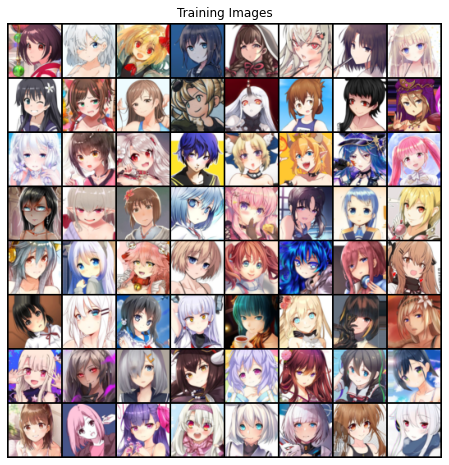

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
# custom weights initialization called on netG and netD
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# GENERATOR

In [6]:
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # input is Z, going into a convolution
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [7]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.02.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


# DISCRIMINATOR

In [8]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [9]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


# Loss and Optimizer

In [10]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training

Starting Training Loop...
[0/5][0/721]	Loss_D: 2.1742	Loss_G: 4.4497	D(x): 0.3769	D(G(z)): 0.5731 / 0.0170
[0/5][50/721]	Loss_D: 0.3226	Loss_G: 5.7132	D(x): 0.8238	D(G(z)): 0.0153 / 0.0175
[0/5][100/721]	Loss_D: 0.4645	Loss_G: 4.3187	D(x): 0.7723	D(G(z)): 0.0847 / 0.0278
[0/5][150/721]	Loss_D: 0.2415	Loss_G: 4.1586	D(x): 0.9057	D(G(z)): 0.0721 / 0.0226
[0/5][200/721]	Loss_D: 0.1354	Loss_G: 4.6217	D(x): 0.9116	D(G(z)): 0.0181 / 0.0290
[0/5][250/721]	Loss_D: 0.8164	Loss_G: 5.9631	D(x): 0.8648	D(G(z)): 0.3527 / 0.0102
[0/5][300/721]	Loss_D: 1.2104	Loss_G: 2.7502	D(x): 0.4410	D(G(z)): 0.0230 / 0.0901
[0/5][350/721]	Loss_D: 0.7076	Loss_G: 4.2542	D(x): 0.9176	D(G(z)): 0.3908 / 0.0236
[0/5][400/721]	Loss_D: 0.8870	Loss_G: 6.6741	D(x): 0.7814	D(G(z)): 0.3825 / 0.0034
[0/5][450/721]	Loss_D: 0.5619	Loss_G: 4.7342	D(x): 0.7747	D(G(z)): 0.1700 / 0.0129
[0/5][500/721]	Loss_D: 0.3013	Loss_G: 4.7831	D(x): 0.9166	D(G(z)): 0.1624 / 0.0147
[0/5][550/721]	Loss_D: 0.2645	Loss_G: 5.1328	D(x): 0.8223	D(G(z)

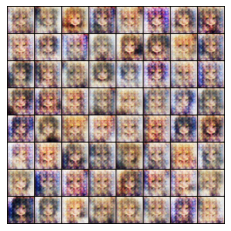

[1/5][0/721]	Loss_D: 0.4277	Loss_G: 2.4044	D(x): 0.7880	D(G(z)): 0.0887 / 0.1361
[1/5][50/721]	Loss_D: 0.6247	Loss_G: 4.3426	D(x): 0.7391	D(G(z)): 0.1430 / 0.0248
[1/5][100/721]	Loss_D: 0.5130	Loss_G: 4.4756	D(x): 0.7278	D(G(z)): 0.0392 / 0.0215
[1/5][150/721]	Loss_D: 0.6310	Loss_G: 4.9929	D(x): 0.8027	D(G(z)): 0.2741 / 0.0124
[1/5][200/721]	Loss_D: 0.6181	Loss_G: 6.1300	D(x): 0.8928	D(G(z)): 0.3435 / 0.0037
[1/5][250/721]	Loss_D: 0.5748	Loss_G: 4.7417	D(x): 0.7817	D(G(z)): 0.2062 / 0.0154
[1/5][300/721]	Loss_D: 0.5304	Loss_G: 5.0981	D(x): 0.8563	D(G(z)): 0.2560 / 0.0129
[1/5][350/721]	Loss_D: 0.6354	Loss_G: 5.0851	D(x): 0.8896	D(G(z)): 0.3264 / 0.0128
[1/5][400/721]	Loss_D: 1.4047	Loss_G: 4.5242	D(x): 0.8532	D(G(z)): 0.5851 / 0.0313
[1/5][450/721]	Loss_D: 0.7589	Loss_G: 4.7622	D(x): 0.7457	D(G(z)): 0.2777 / 0.0183
[1/5][500/721]	Loss_D: 0.3921	Loss_G: 5.4033	D(x): 0.7830	D(G(z)): 0.0475 / 0.0084
[1/5][550/721]	Loss_D: 0.5513	Loss_G: 3.6545	D(x): 0.7523	D(G(z)): 0.1519 / 0.0407
[1/5][6

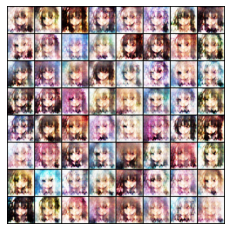

[2/5][0/721]	Loss_D: 0.5760	Loss_G: 4.0935	D(x): 0.8566	D(G(z)): 0.2808 / 0.0278
[2/5][50/721]	Loss_D: 0.5130	Loss_G: 5.8072	D(x): 0.9071	D(G(z)): 0.2555 / 0.0065
[2/5][100/721]	Loss_D: 0.4765	Loss_G: 5.0372	D(x): 0.7907	D(G(z)): 0.1343 / 0.0136
[2/5][150/721]	Loss_D: 0.6129	Loss_G: 5.2586	D(x): 0.6463	D(G(z)): 0.0238 / 0.0163
[2/5][200/721]	Loss_D: 0.7828	Loss_G: 6.6980	D(x): 0.9505	D(G(z)): 0.4443 / 0.0027
[2/5][250/721]	Loss_D: 0.7306	Loss_G: 7.6568	D(x): 0.6182	D(G(z)): 0.0045 / 0.0018
[2/5][300/721]	Loss_D: 0.3851	Loss_G: 4.6256	D(x): 0.8882	D(G(z)): 0.1929 / 0.0152
[2/5][350/721]	Loss_D: 0.8355	Loss_G: 2.0726	D(x): 0.5581	D(G(z)): 0.0161 / 0.2087
[2/5][400/721]	Loss_D: 0.9864	Loss_G: 9.0989	D(x): 0.9024	D(G(z)): 0.4974 / 0.0003
[2/5][450/721]	Loss_D: 0.2866	Loss_G: 3.1183	D(x): 0.8968	D(G(z)): 0.1331 / 0.0859
[2/5][500/721]	Loss_D: 1.4881	Loss_G: 9.5947	D(x): 0.9540	D(G(z)): 0.6497 / 0.0002
[2/5][550/721]	Loss_D: 0.3357	Loss_G: 4.3013	D(x): 0.9076	D(G(z)): 0.1802 / 0.0249
[2/5][6

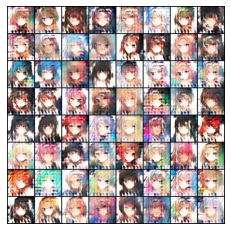

[3/5][0/721]	Loss_D: 0.9103	Loss_G: 3.8589	D(x): 0.5146	D(G(z)): 0.0076 / 0.0504
[3/5][50/721]	Loss_D: 1.5711	Loss_G: 2.0614	D(x): 0.3147	D(G(z)): 0.0072 / 0.1993


In [12]:
# Training Loop

# Lists to keep track of progress
img_list = []
fid_img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):

        ############################
        # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
        ###########################
        ## Train with all-real batch
        netD.zero_grad()
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # Calculate loss on all-real batch
        errD_real = criterion(output, label)
        # Calculate gradients for D in backward pass
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # Classify all fake batch with D
        output = netD(fake.detach()).view(-1)
        # Calculate D's loss on the all-fake batch
        errD_fake = criterion(output, label)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        errD = errD_real + errD_fake
        # Update D
        optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        label.fill_(real_label)  # fake labels are real for generator cost
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate G's loss based on this output
        errG = criterion(output, label)
        # Calculate gradients for G
        errG.backward()
        D_G_z2 = output.mean().item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            #with torch.no_grad():
            #    temp = netG(fixed_noise).detach().cpu()
            #    imsave(temp,epoch,i)

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
        
        #image_save(fake, epoch , i)

        iters += 1


    plt.figure(figsize=(4,4))
    plt.plot()
    plt.axis("off")
    plt.imshow(np.transpose(img_list[-1],(1,2,0)))
    plt.show()


# Plotting results

## Loss plot

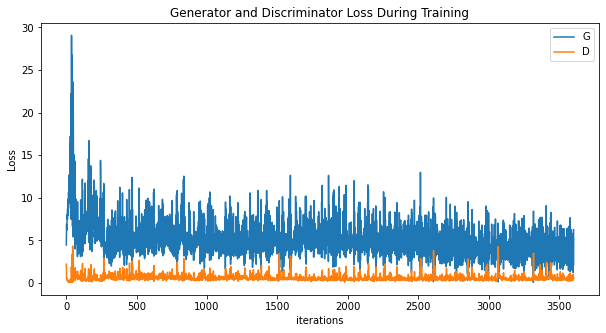

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

## Images generated during training

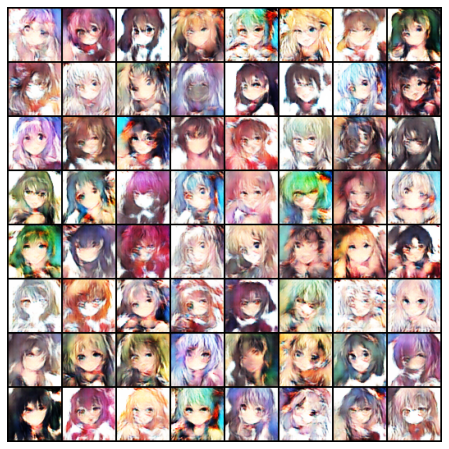

In [ ]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

## Compare real and generated images

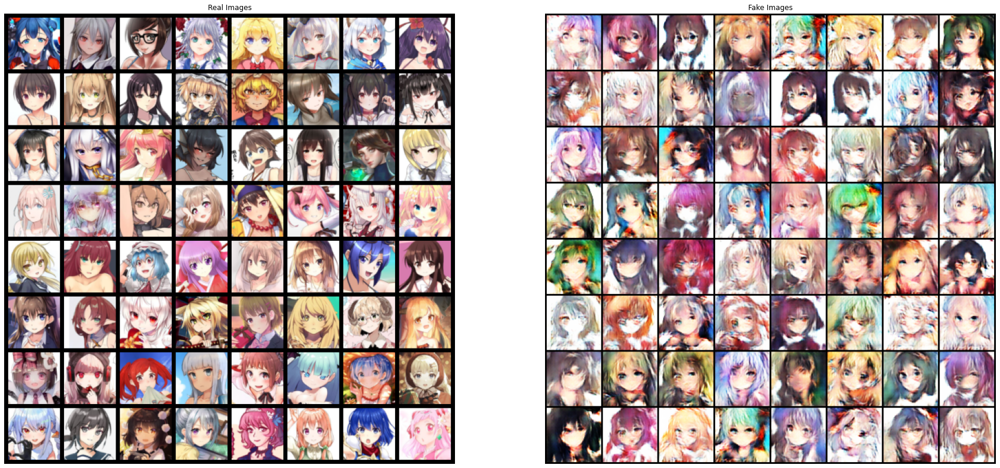

In [ ]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(30,30))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()